<a href="https://colab.research.google.com/github/Rhodham96/LGG-Thomas5/blob/Robin/PersonalProjects/CNN/CNN_imageRecognizer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Recognizer -> CNN
[Medium Article](https://medium.com/@robin.hamers/building-a-bike-vs-car-recognizer-with-convolutional-neural-networks-29686a097eaa)

In [8]:
!pip install wget # Install the wget package for file download
!pip install cv2
!pip install torch
!pip install torchvision



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
  Obtaining dependency information for torchvision from https://files.pythonhosted.org/packages/29/88/00c69db213ee2443ada8886ec60789b227e06bb869d85ee324578221a7f7/torchvision-0.21.0-cp311-cp311-macosx_11_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 7.3 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [9]:
#
#import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import datetime
import torch
import torch.nn.functional as F
from torch import nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import zipfile
import pathlib
import os
import wget
import random
import shutil
%pylab inline


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/Users/robinhamers/.pyenv/versions/3.11.6/lib/python3.11/site-packages/IPython/core/magics/pylab.py:166: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [ ]:
import urllib.request
from pathlib import Path

# 1. Download the Bike zip file
bike_zip_url = "https://github.com/Rhodham96/LGG-Thomas5/raw/main/PersonalProjects/CNN/Bike.zip"
bike_zip_path = Path("/content/datasets/Bike.zip")

# Download the file
urllib.request.urlretrieve(bike_zip_url, bike_zip_path)

# 2. Extract the Bike zip file
extracted_dir = Path("/content/datasets/Train")
with zipfile.ZipFile(bike_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)


98924686/98924686 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
/content/datasets/Train/Bike
/content/datasets/Train/Bike


In [ ]:
# 1. Download the Car zip file
car_zip_url = "https://github.com/Rhodham96/LGG-Thomas5/raw/main/PersonalProjects/CNN/Car.zip"
car_zip_path = Path("/content/datasets/Car.zip")

# Download the file
urllib.request.urlretrieve(car_zip_url, car_zip_path)

# 2. Extract the Bike zip file
extracted_dir = Path("/content/datasets/Train")
with zipfile.ZipFile(car_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

/content/datasets/Train/Car
/content/datasets/Train/Car


In [5]:
data_dir = pathlib.Path("/content/datasets/Train")
image_count = len(list(data_dir.glob('*/*')))
print(image_count)

4210


In [6]:
import random
# Define the source and target directories
source_dir = '/content/datasets/Train/Bike'
target_dir = '/content/datasets/Val/Bike'

# Create the target directory if it doesn't exist
os.makedirs(target_dir, exist_ok=True)

# Get all files in the source directory
all_files = [f for f in os.listdir(source_dir) if os.path.isfile(os.path.join(source_dir, f))]

# Randomly select 400 files from the list
selected_files = random.sample(all_files, 435)

# Move the selected files to the target directory
for file in selected_files:
    src_file = os.path.join(source_dir, file)
    tgt_file = os.path.join(target_dir, file)

    # Move the file
    shutil.move(src_file, tgt_file)

print(f"Moved {len(selected_files)} files from {source_dir} to {target_dir}")

# Define the source and target directories
source_dir = '/content/datasets/Train/Car'
target_dir = '/content/datasets/Val/Car'

# Create the target directory if it doesn't exist
os.makedirs(target_dir, exist_ok=True)

# Get all files in the source directory
all_files = [f for f in os.listdir(source_dir) if os.path.isfile(os.path.join(source_dir, f))]

# Randomly select 400 files from the list
selected_files = random.sample(all_files, 435)

# Move the selected files to the target directory
for file in selected_files:
    src_file = os.path.join(source_dir, file)
    tgt_file = os.path.join(target_dir, file)

    # Move the file
    shutil.move(src_file, tgt_file)

print(f"Moved {len(selected_files)} files from {source_dir} to {target_dir}")

CarVal = '/content/datasets/dataset/CarVal'
BikeVal = '/content/datasets/dataset/BikeVal'

Moved 435 files from /content/datasets/Train/Bike to /content/datasets/Val/Bike
Moved 435 files from /content/datasets/Train/Car to /content/datasets/Val/Car


In [7]:
import random
# Define the source and target directories
source_dir = '/content/datasets/Train/Bike'
target_dir = '/content/datasets/Test/Bike'

# Create the target directory if it doesn't exist
os.makedirs(target_dir, exist_ok=True)

# Get all files in the source directory
all_files = [f for f in os.listdir(source_dir) if os.path.isfile(os.path.join(source_dir, f))]

# Randomly select 400 files from the list
selected_files = random.sample(all_files, 10)

# Move the selected files to the target directory
for file in selected_files:
    src_file = os.path.join(source_dir, file)
    tgt_file = os.path.join(target_dir, file)

    # Move the file
    shutil.move(src_file, tgt_file)

print(f"Moved {len(selected_files)} files from {source_dir} to {target_dir}")

# Define the source and target directories
source_dir = '/content/datasets/Train/Car'
target_dir = '/content/datasets/Test/Car'

# Create the target directory if it doesn't exist
os.makedirs(target_dir, exist_ok=True)

# Get all files in the source directory
all_files = [f for f in os.listdir(source_dir) if os.path.isfile(os.path.join(source_dir, f))]

# Randomly select 400 files from the list
selected_files = random.sample(all_files, 10)

# Move the selected files to the target directory
for file in selected_files:
    src_file = os.path.join(source_dir, file)
    tgt_file = os.path.join(target_dir, file)

    # Move the file
    shutil.move(src_file, tgt_file)

print(f"Moved {len(selected_files)} files from {source_dir} to {target_dir}")

Test = '/content/datasets/dataset/Test'

Moved 10 files from /content/datasets/Train/Bike to /content/datasets/Test/Bike
Moved 10 files from /content/datasets/Train/Car to /content/datasets/Test/Car


In [8]:
Train_dir = pathlib.Path("/content/datasets/Train")
BikeTrain_dir = pathlib.Path("/content/datasets/Train/Bike")
CarTrain_dir = pathlib.Path("/content/datasets/Train/Car")

Val_dir = pathlib.Path("/content/datasets/Val")
BikeVal_dir = pathlib.Path("/content/datasets/Val/Bike")
CarVal_dir = pathlib.Path("/content/datasets/Val/Car")

Test_dir = pathlib.Path("/content/datasets/Test")
BikeTest_dir = pathlib.Path("/content/datasets/Test/Bike")
CarTest_dir = pathlib.Path("/content/datasets/Test/Car")

In [9]:
def remove_macosx(root_dir):
    """
    Removes all directories named '__MACOSX' and their contents
    within the specified root directory.
    """
    for root, dirs, files in os.walk(root_dir):
        for dir_name in dirs:
            if dir_name == '__MACOSX':
                dir_path = os.path.join(root, dir_name)
                print(f"Removing: {dir_path}")
                shutil.rmtree(dir_path)

# Call the function to remove '__MACOSX' directories within 'content'
content_dir = '/content' # Replace with the actual path to your 'content' directory
remove_macosx(content_dir)

Removing: /content/datasets/Train/__MACOSX


In [10]:
import os
import imghdr
import shutil  # Import shutil for file operations

def find_unsupported_images(directory):
    unsupported_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                image_type = imghdr.what(file_path)
                if image_type not in ['jpeg', 'png', 'gif', 'bmp']:
                    unsupported_files.append(file_path)
            except Exception:  # Handle potential errors during image type detection
                unsupported_files.append(file_path)
    return unsupported_files

def remove_unsupported_images(unsupported_files):
    for file_path in unsupported_files:
        print(f"Removing unsupported file: {file_path}")
        os.remove(file_path)  # Remove the unsupported file

# ... (Your existing code for loading data) ...

# Find and remove unsupported images before creating the datasets
unsupported_train_images = find_unsupported_images(Train_dir)
unsupported_val_images = find_unsupported_images(Val_dir)

remove_unsupported_images(unsupported_train_images)
remove_unsupported_images(unsupported_val_images)

print("Unsupported images in training directory:", unsupported_train_images)
print("Unsupported images in validation directory:", unsupported_val_images)

Removing unsupported file: /content/datasets/Train/Car/2025-EQS450-SEDAN-AVP-DR.webp
Removing unsupported file: /content/datasets/Train/Car/SUVs-2.webp
Removing unsupported file: /content/datasets/Train/Car/Best-5-Electric-Cars-in-UAE.webp
Removing unsupported file: /content/datasets/Train/Car/FAMILY-BANNER.webp
Removing unsupported file: /content/datasets/Train/Car/2024-AMG-GT55-COUPE-AVP-DR.webp
Removing unsupported file: /content/datasets/Train/Car/i20_Executive_Thumbnail_png_1719910104New_webp_1720006912.webp
Removing unsupported file: /content/datasets/Train/Car/website-final.svg
Removing unsupported file: /content/datasets/Train/Car/mspin_googcolor_medium.svg
Removing unsupported file: /content/datasets/Train/Car/Car (2).jpg
Removing unsupported file: /content/datasets/Train/Car/680.webp
Removing unsupported file: /content/datasets/Train/Bike/close-up-of-a-motorbike-508x348.jpg
Removing unsupported file: /content/datasets/Train/Bike/125cc-150cc-Haojue-Bike-Motorcycles-Motorbike-E

<ipython-input-10-697a6989958d>:2: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [ ]:
img_height = 200  # Set your desired image height
img_width = 200  # Set your desired image width
batch_size = 32  # Set your desired batch size

# Define your transformations (similar to TensorFlow's preprocessing)
transform = transforms.Compose([
    transforms.Resize((img_height, img_width)),
    transforms.ToTensor(),  # Convert image to tensor
])

# Load dataset (assuming images are organized in subfolders for each class)
train_dataset = datasets.ImageFolder('Train_dir', transform=transform)

# Create a DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

'''# Example usage: Iterating through the dataset
for images, labels in dataloader:
    print(images.shape)  # Example: torch.Size([32, 3, 256, 256])
    print(labels)
    break  # Just show the first batch'''

# Load dataset (assuming images are organized in subfolders for each class)
val_dataset = datasets.ImageFolder('Val_dir', transform=transform)

# Create a DataLoader
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

# Load dataset (assuming images are organized in subfolders for each class)
test_dataset = datasets.ImageFolder('Test_dir', transform=transform)

# Create a DataLoader
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

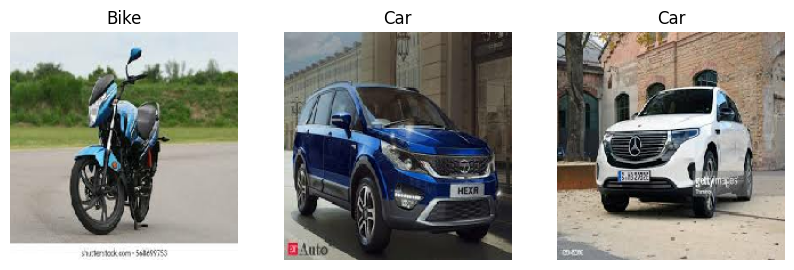

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming dataloader and class_names are set up as per the previous PyTorch code
class_names = train_dataset.classes  # Dataset classes, as ImageFolder uses folder names

# Get a batch of images and labels from the dataloader
data_iter = iter(train_dataloader)
images, labels = next(data_iter)

# Plot the images
plt.figure(figsize=(10, 10))
for i in range(3):
    ax = plt.subplot(1, 3, i + 1)
    
    # Convert the image tensor to a NumPy array (C, H, W) -> (H, W, C)
    image = images[i].permute(1, 2, 0).numpy()
    
    # If image is normalized, unnormalize (assuming normalization was done)
    # image = image * std + mean  # Use your dataset's mean and std values if normalization was applied
    
    # Plot image
    plt.imshow(image.astype("uint8"))
    
    # Get the predicted class index (no need to one-hot decode as `labels` are integers)
    predicted_class_index = labels[i].item()  # `.item()` to get Python scalar from tensor
    
    # Title with class name
    plt.title(class_names[predicted_class_index])
    plt.axis("off")

plt.show()

In [ ]:
class CNNModel(nn.Module):
    def __init__(self, num_classes):
        super(CNNModel, self).__init__()
        # conv_layers
        nn.Conv2D(3, 128, kernel_size = 4, padding=1)
        nn.ReLU()
        nn.MaxPool2d(kernel_size=2)

        nn.Conv2D(128, 64, kernel_size = 4, padding=1)
        nn.ReLU()
        nn.MaxPool2d(kernel_size=2)

        nn.Conv2D(64, 32, kernel_size = 4, padding=1)
        nn.ReLU()
        nn.MaxPool2d(kernel_size=2)

        nn.Conv2D(32, 16, kernel_size = 4, padding=1)
        nn.ReLU()
        nn.MaxPool2d(kernel_size=2)

        nn.Flatten()

        nn.Linear(16*(img_height//16)*(img_width//16), 64)
        nn.ReLU()

        nn.Linear(64, num_classes)


    def forward(self, x):
        return self.model(x)

num_classes = 2
model = CNNModel(num_classes)

# Print the model summary (just to check architecture)
print(model)

In [ ]:
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter

criterion = nn.CrossEntropyLoss()  # No softmax in the model
optimizer = optim.Adam(model.parameters(), lr=0.001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the correct device

# Initialize TensorBoard
writer = SummaryWriter("logs")

num_epochs = 10

for epoch in range(num_epochs):
    model.train()  # Set to training mode
    running_loss = 0.0
    correct = 0
    total = 0
    
    for images, labels in train_dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()  # Zero the gradients
        outputs = model(images)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()  # Backpropagation
        optimizer.step()  # Update weights

        running_loss += loss.item()
        _, predicted = outputs.max(1)  # Get predicted class
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

    train_acc = 100 * correct / total
    train_loss = running_loss / len(train_dataloader)

    # Log to TensorBoard
    writer.add_scalar("Loss/train", train_loss, epoch)
    writer.add_scalar("Accuracy/train", train_acc, epoch)

    print(f"Epoch {epoch+1}/{num_epochs} - Loss: {train_loss:.4f} - Accuracy: {train_acc:.2f}%")


In [ ]:
from torchsummary import summary
summary(model, (3, img_height, img_width))  # Assuming RGB images

In [ ]:
# Move model to evaluation mode
model.eval()

# Move model to the correct device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get a batch of test data
test_images, test_labels = next(iter(test_dataloader))  # Fetch one batch
test_images, test_labels = test_images.to(device), test_labels.to(device)

# Select 5 random images from the batch
random_indices = random.sample(range(len(test_images)), 5)

for i in random_indices:
    # Get the image and true label
    image = test_images[i].cpu().permute(1, 2, 0).numpy()  # Convert to NumPy and reshape
    true_label = test_labels[i].item()

    # Make a prediction
    with torch.no_grad():  # No gradient computation
        prediction = model(test_images[i].unsqueeze(0))  # Add batch dimension
    predicted_label = torch.argmax(prediction, dim=1).item()

    # Display the image with prediction
    plt.figure()
    plt.imshow(image)
    plt.title(f"True: {train_dataset.classes[true_label]}, Predicted: {train_dataset.classes[predicted_label]}")
    plt.axis('off')
    plt.show()

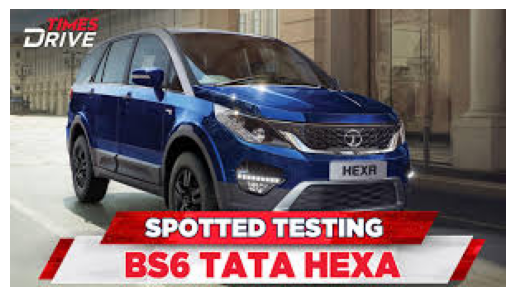

-----------------------------------------------------
1st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 200, 200, 3))
  warnings.warn(msg)


conv2d | Features Shape: (1, 197, 197, 128)
Dimension 128
--------
1nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
max_pooling2d | Features Shape: (1, 98, 98, 128)
Dimension 128
-----------------------------------------------------
-----------------------------------------------------
2st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
conv2d_1 | Features Shape: (1, 95, 95, 64)
Dimension 64
--------
2nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
max_pooling2d_1 | Features Shape: (1, 47, 47, 64)
Dimension 64
-----------------------------------------------------
-----------------------------------------------------
3st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
conv2d_2 | Features Shape: (1, 44, 44, 32)
Dimension 32
--------
3nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
max_pooling2d_2 | Features Shape: (1, 22, 22, 32)
Dimension 32
-----------------------------------------------------
-----------------------------------------------------
4st convo

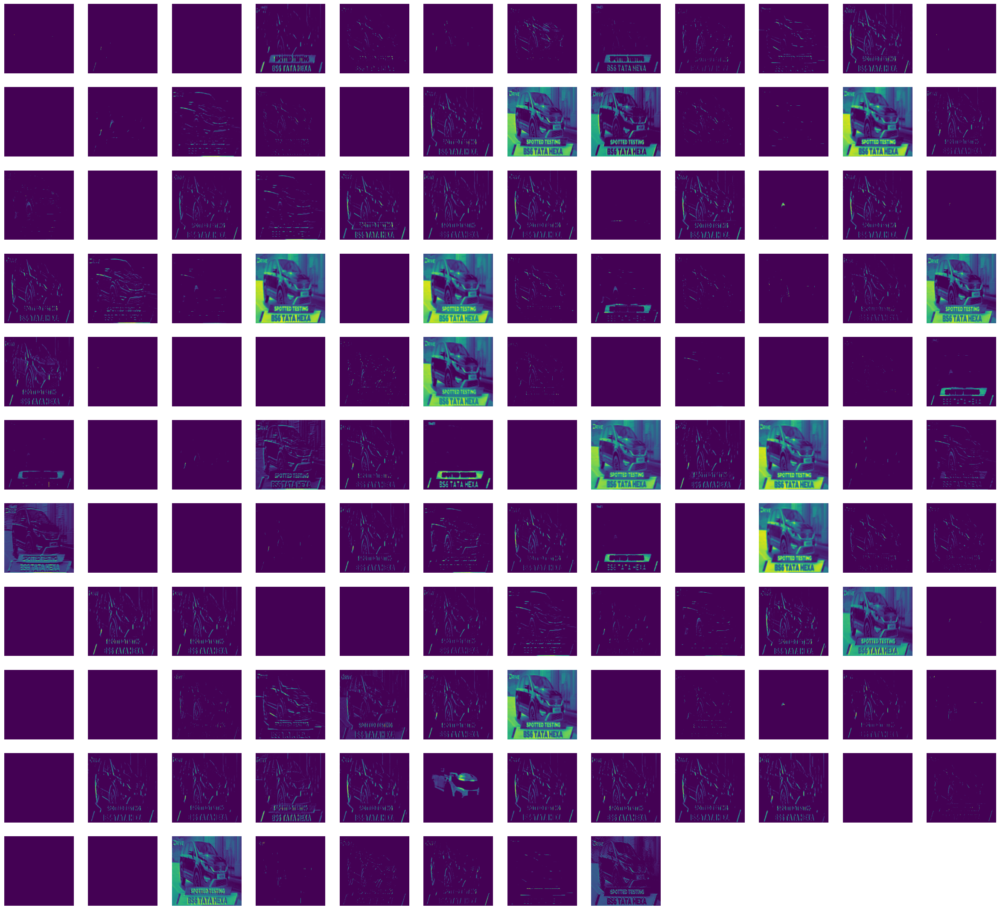

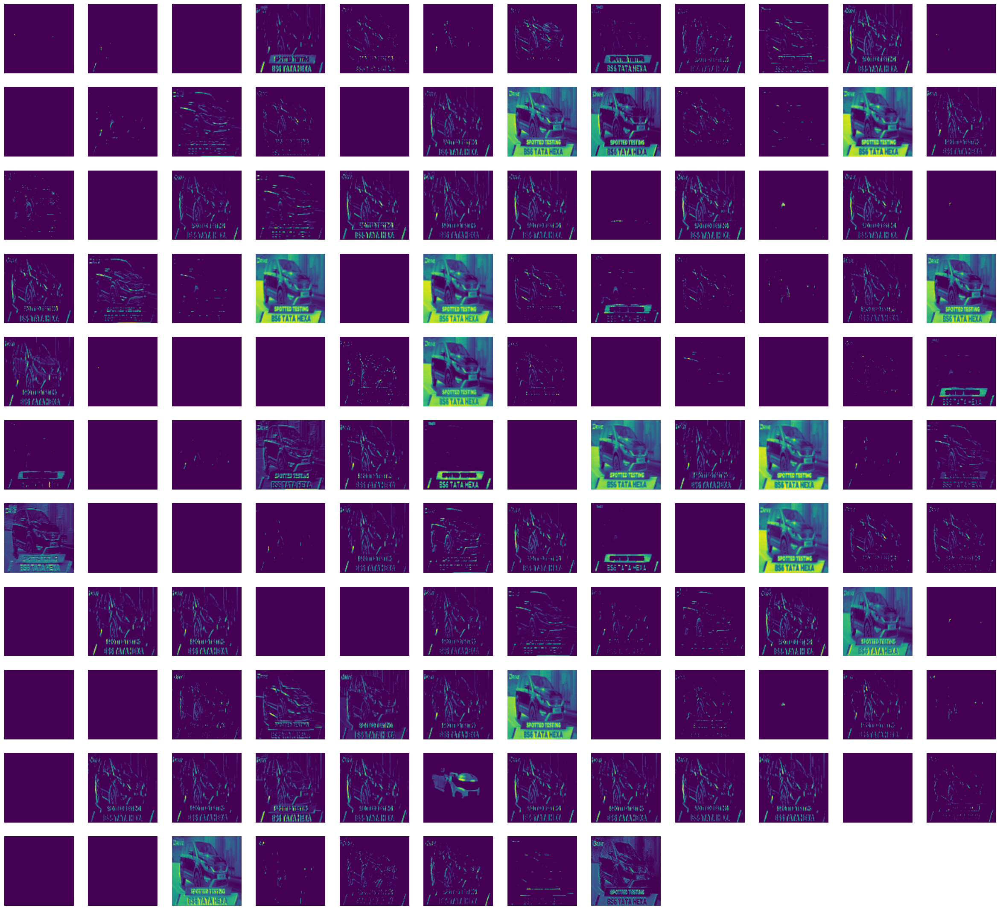

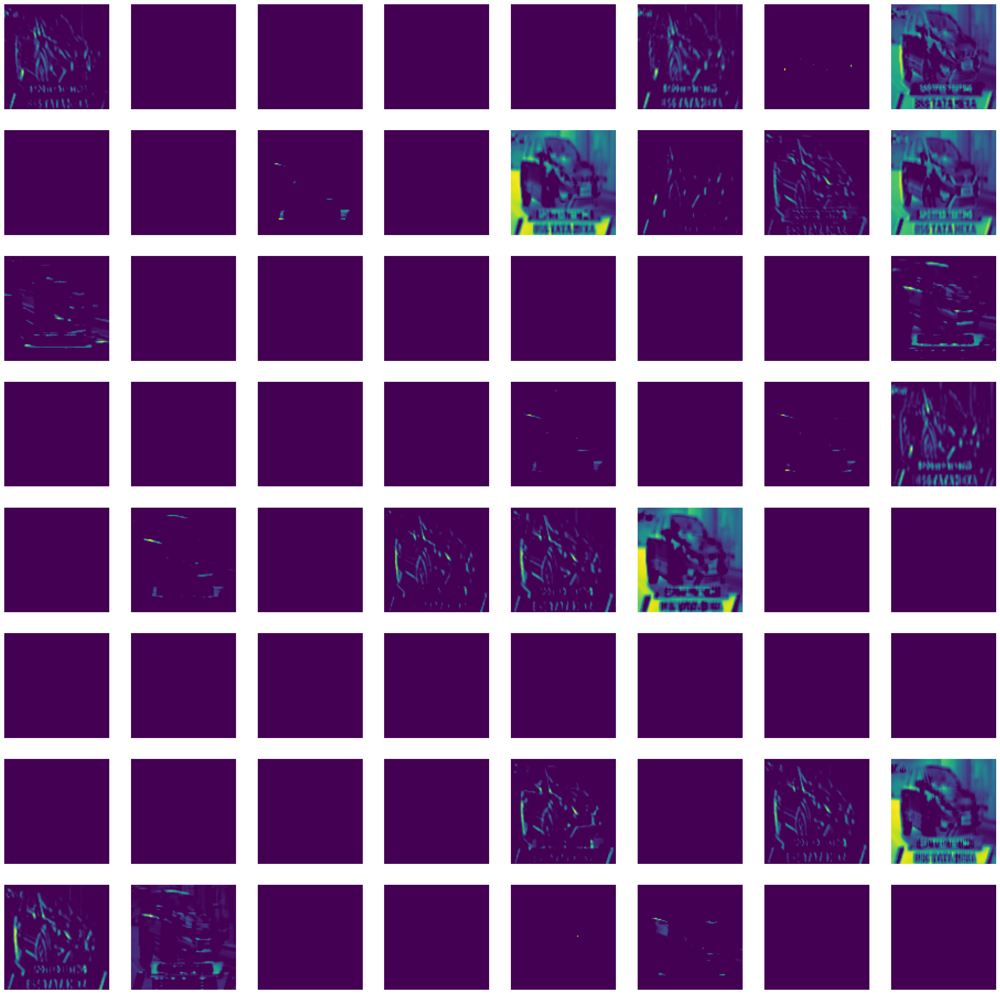

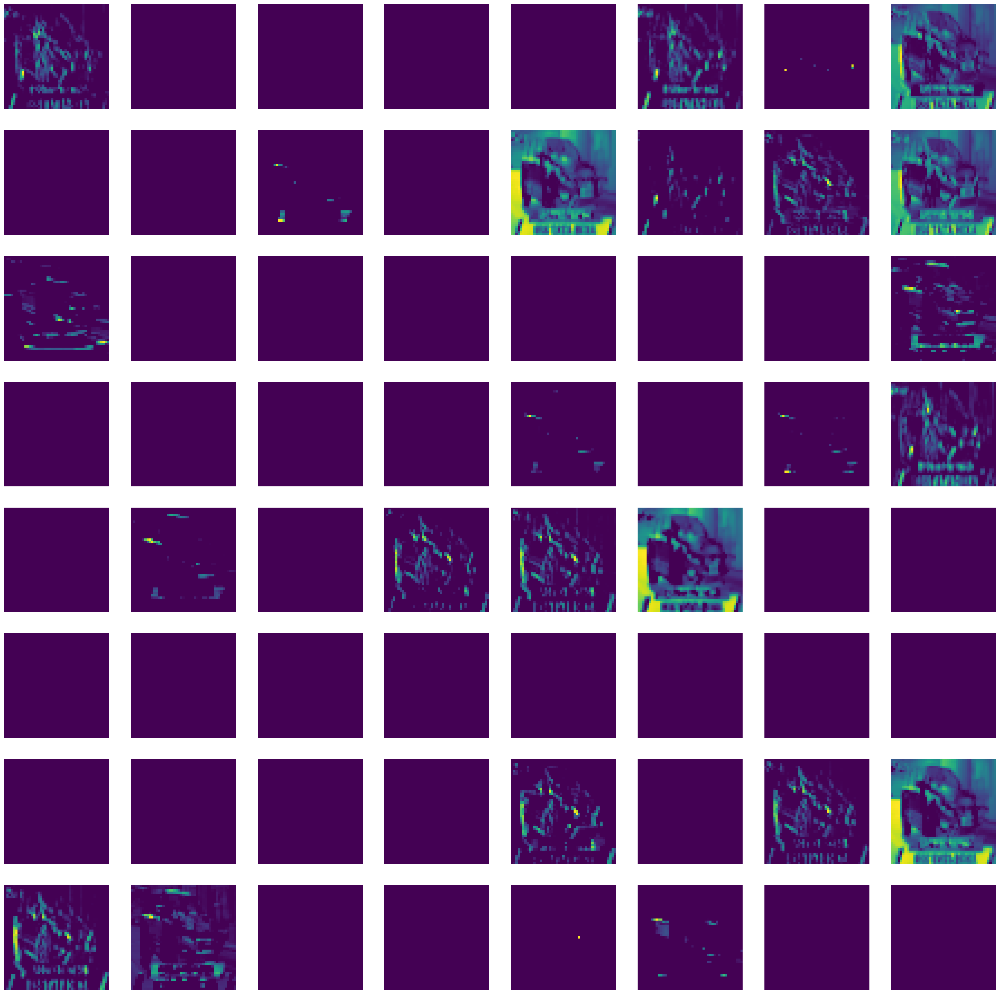

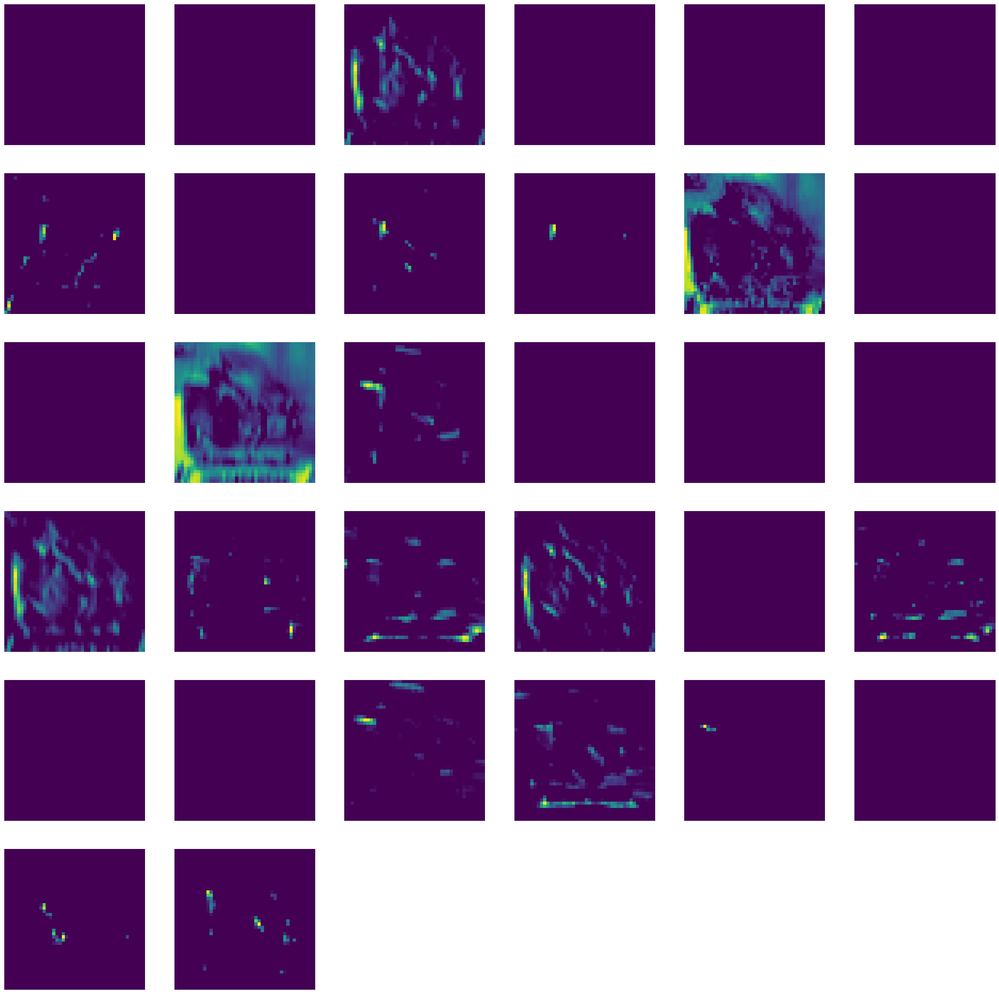

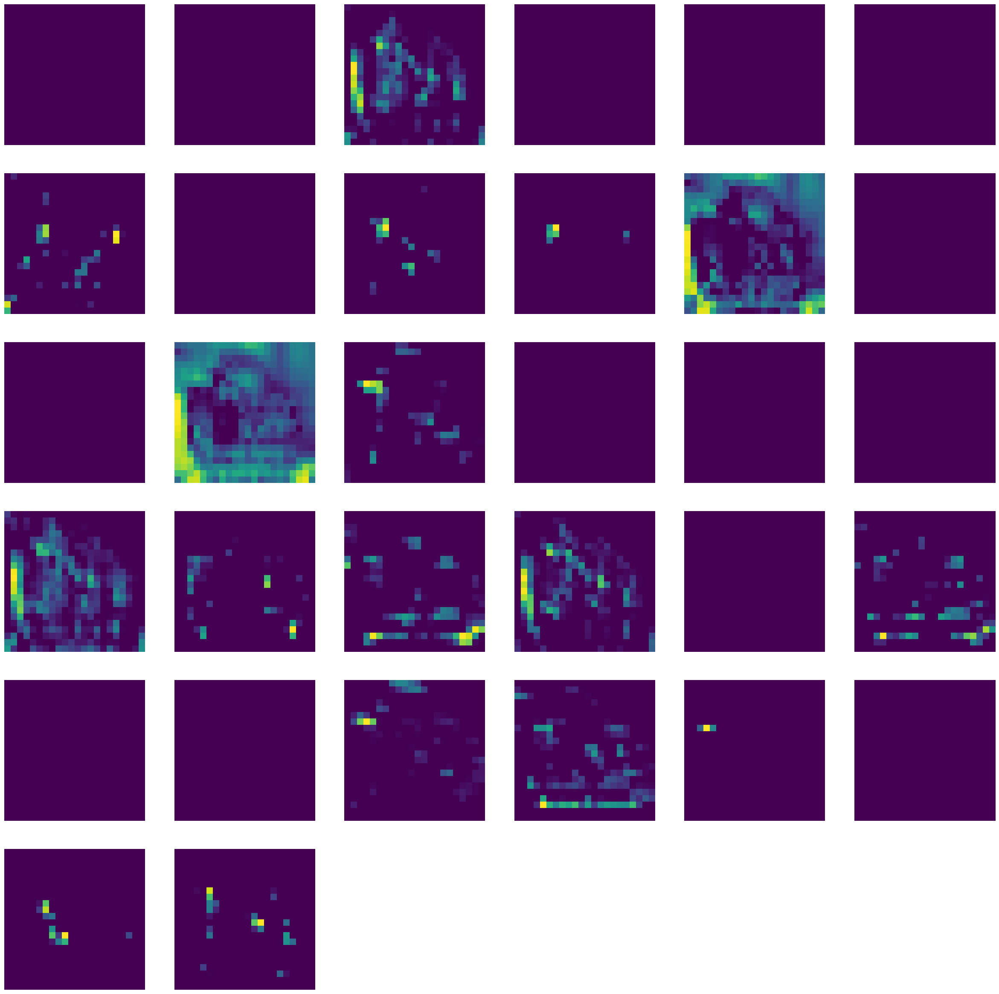

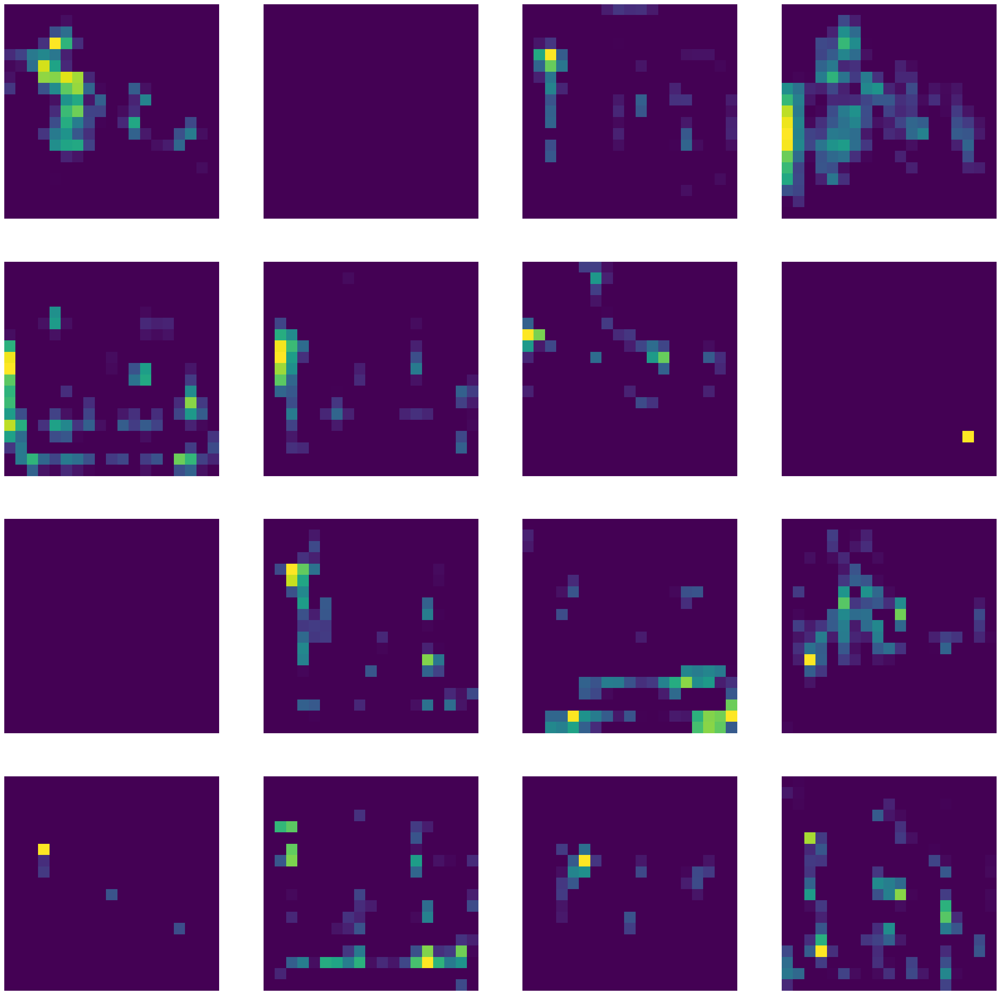

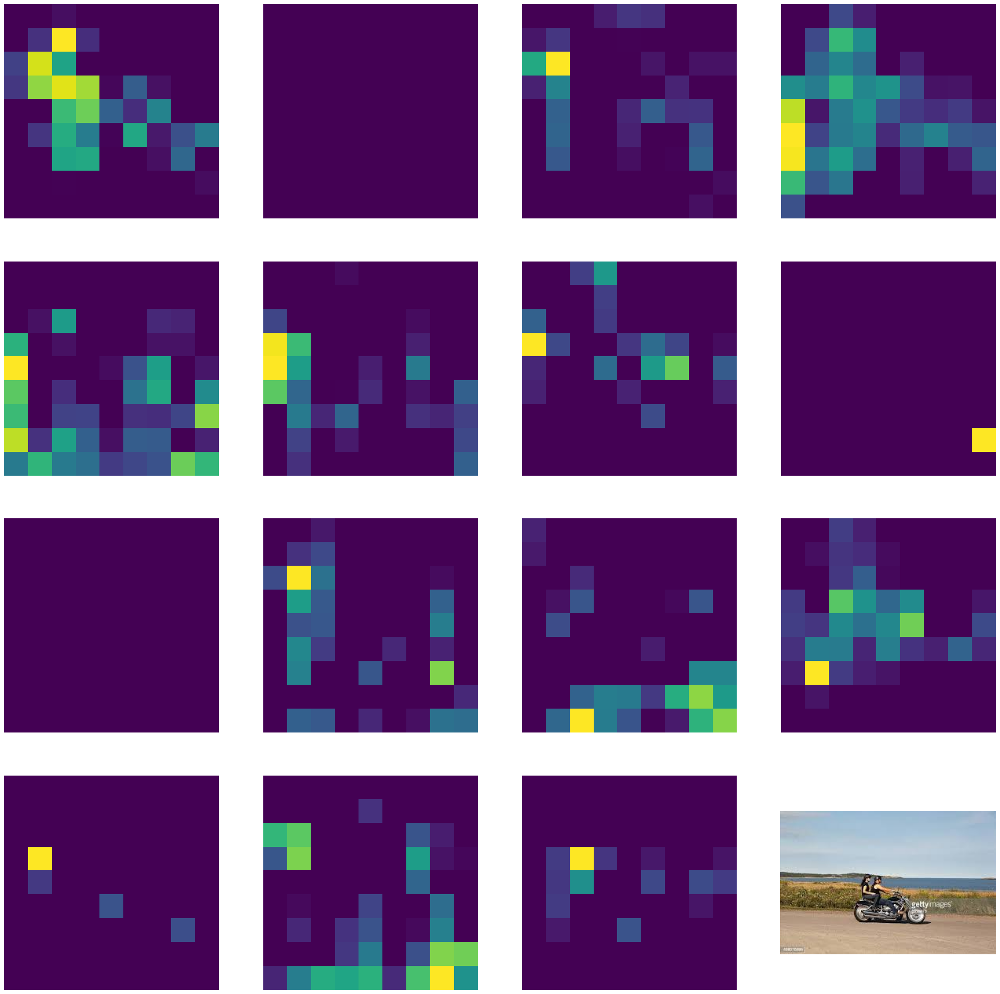

-----------------------------------------------------
1st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
conv2d | Features Shape: (1, 197, 197, 128)
Dimension 128
--------
1nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
max_pooling2d | Features Shape: (1, 98, 98, 128)
Dimension 128
-----------------------------------------------------
-----------------------------------------------------
2st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
conv2d_1 | Features Shape: (1, 95, 95, 64)
Dimension 64
--------
2nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
max_pooling2d_1 | Features Shape: (1, 47, 47, 64)
Dimension 64
-----------------------------------------------------
-----------------------------------------------------
3st convolutionnal layer
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
conv2d_2 | Features Shape: (1, 44, 44, 32)
Dimension 32
--------
3nd Pooling
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
max_pooling2d_2 | Features Shape: (1, 22, 22, 32)
Dimension 32

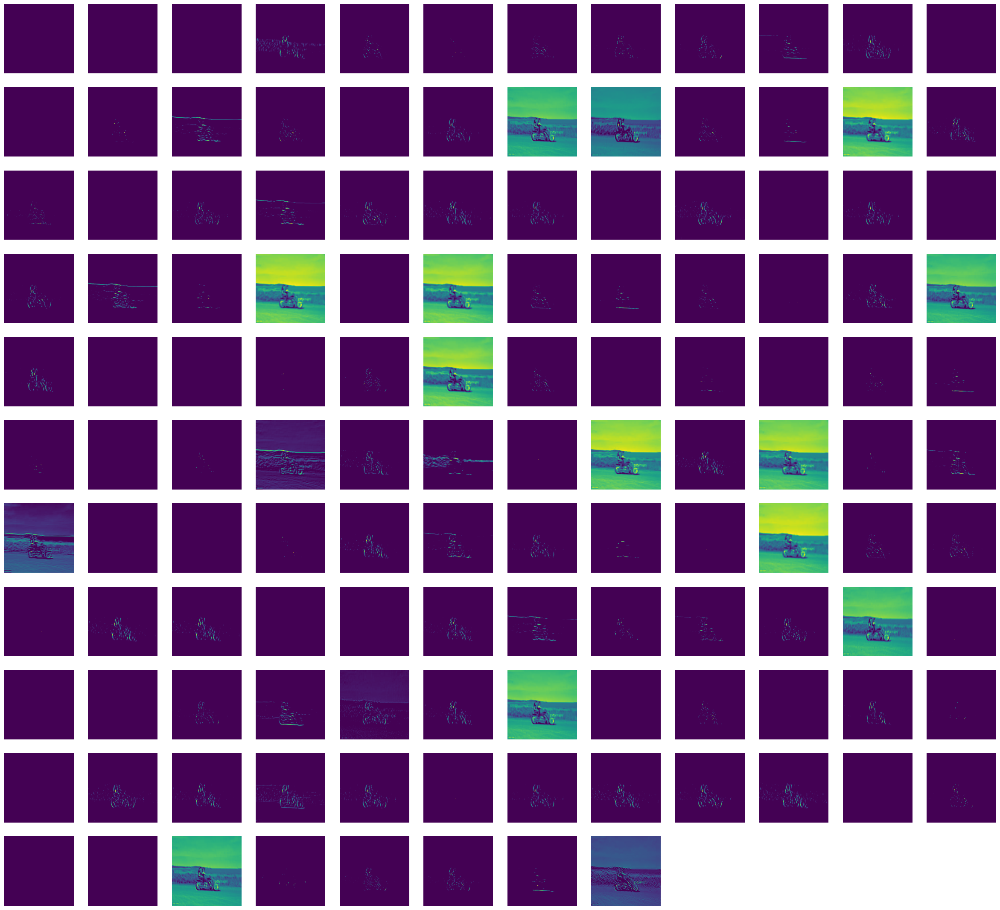

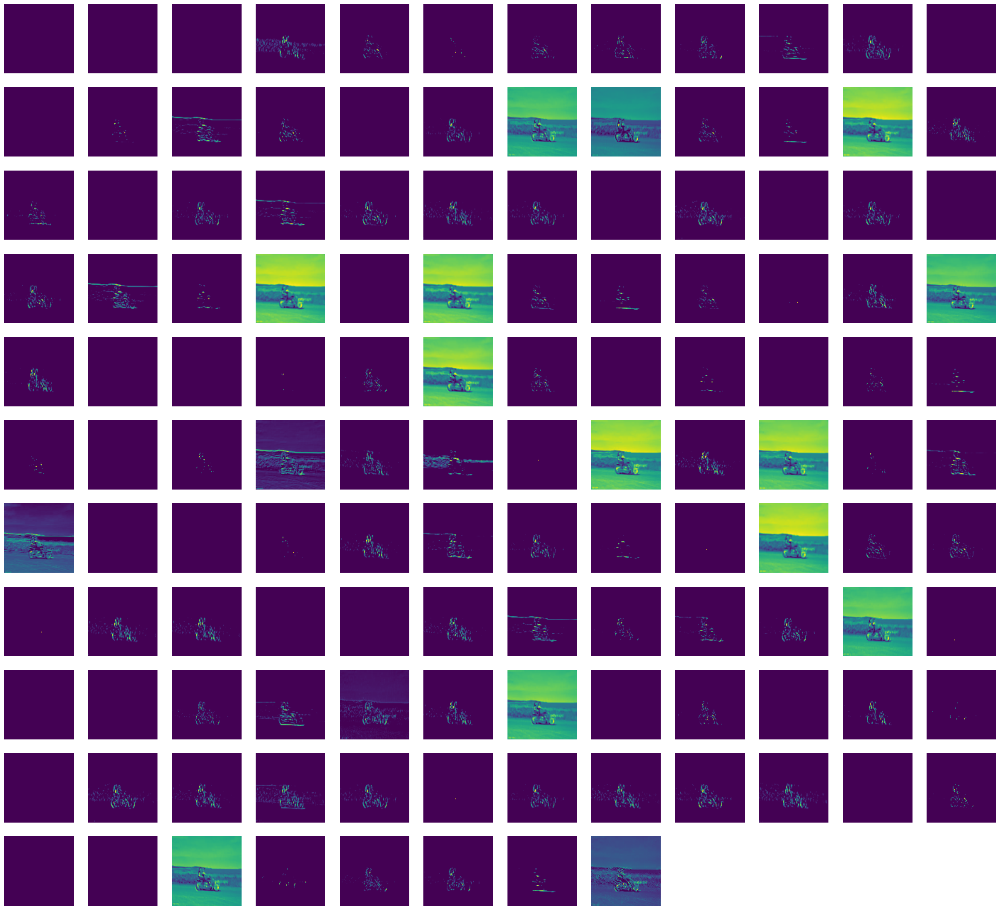

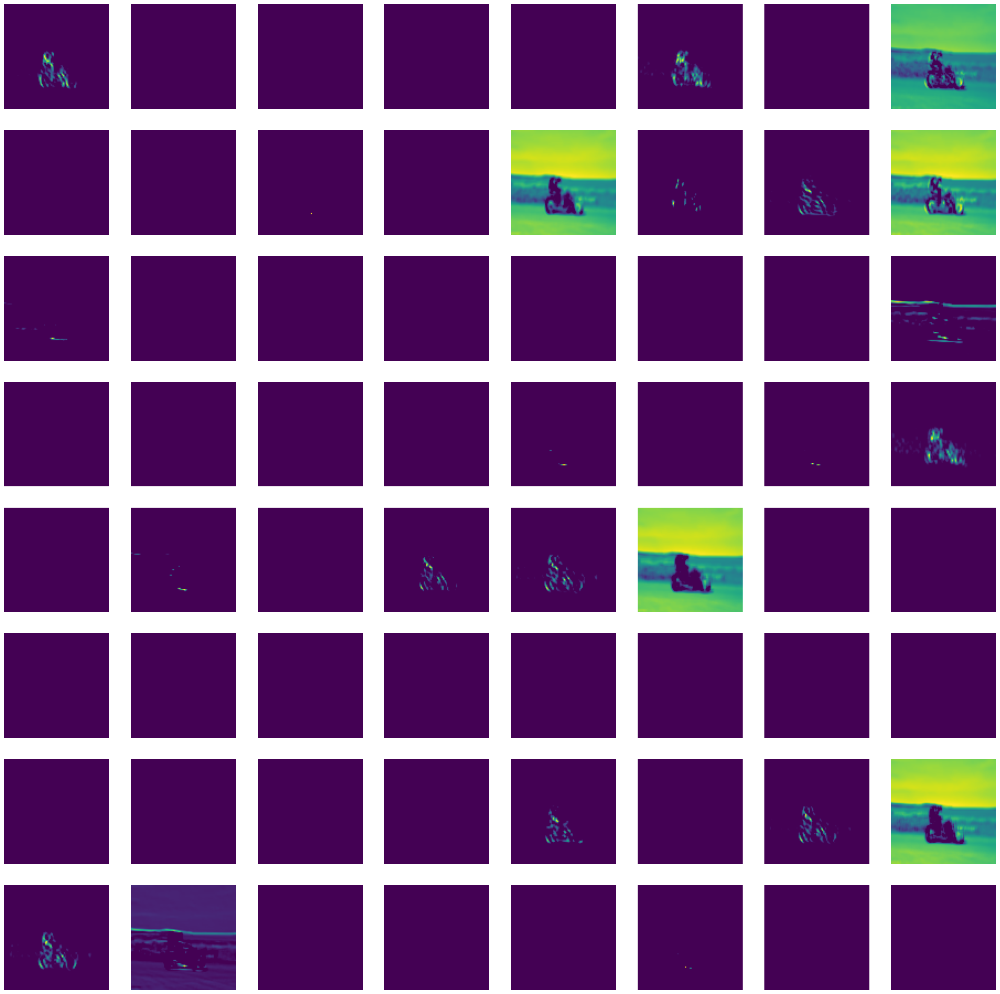

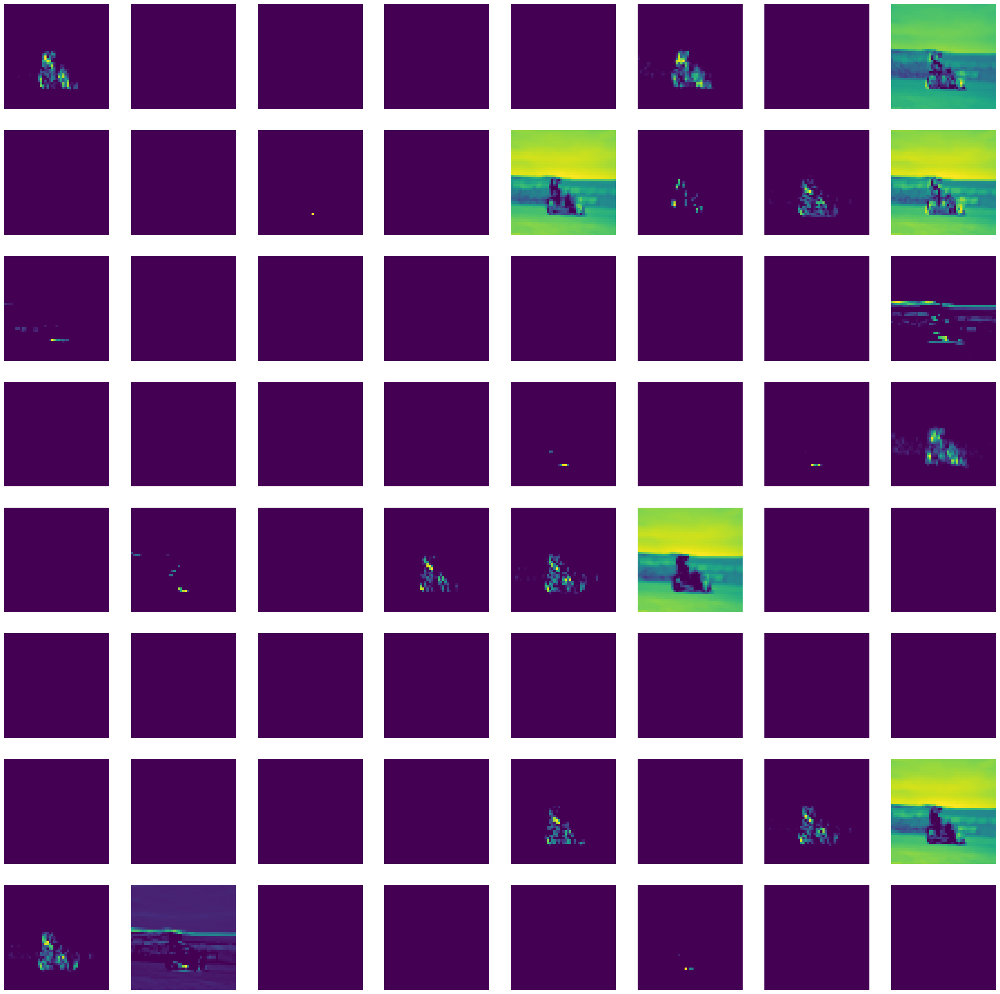

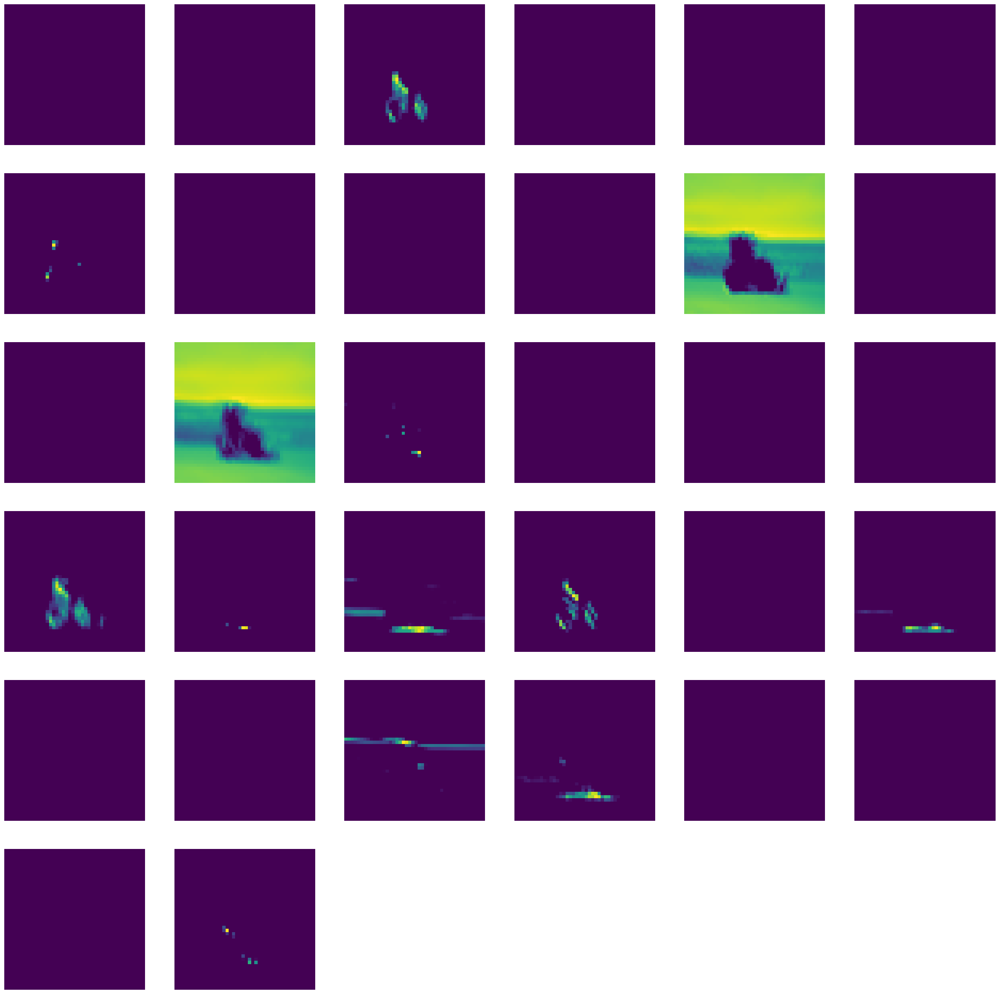

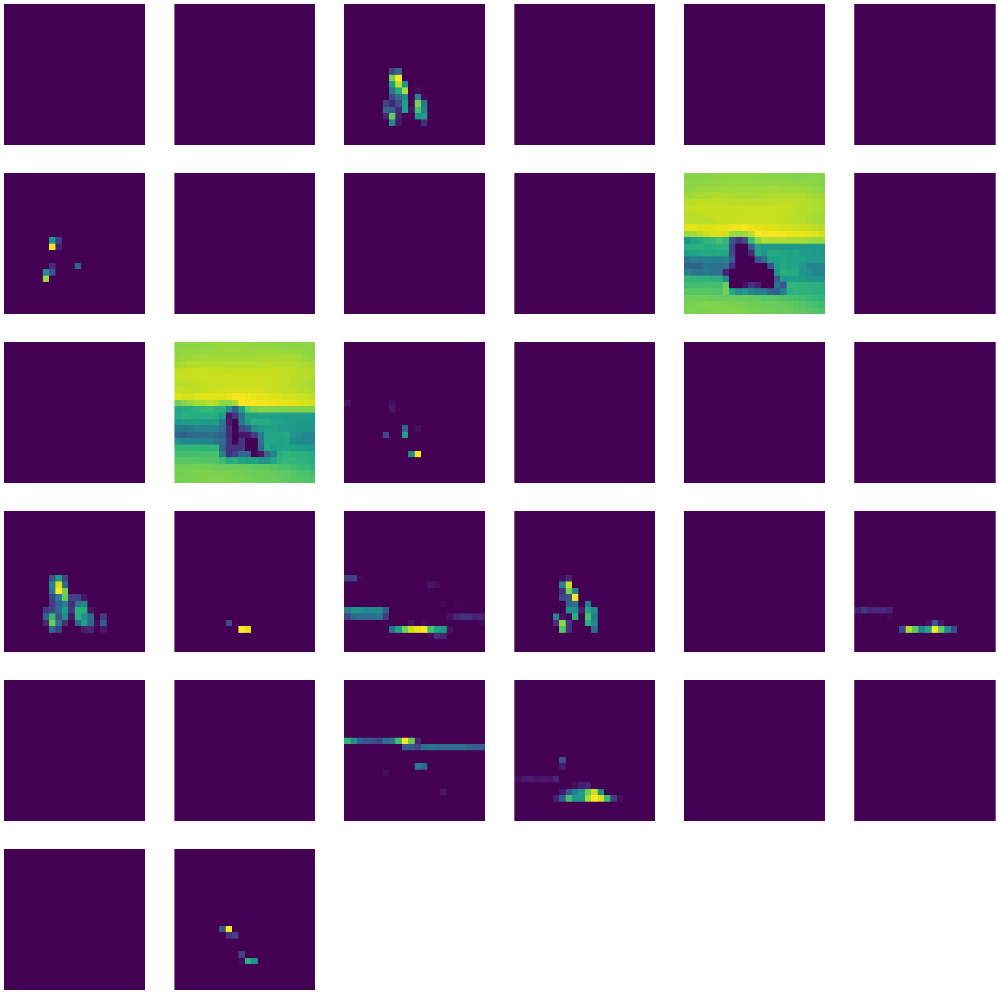

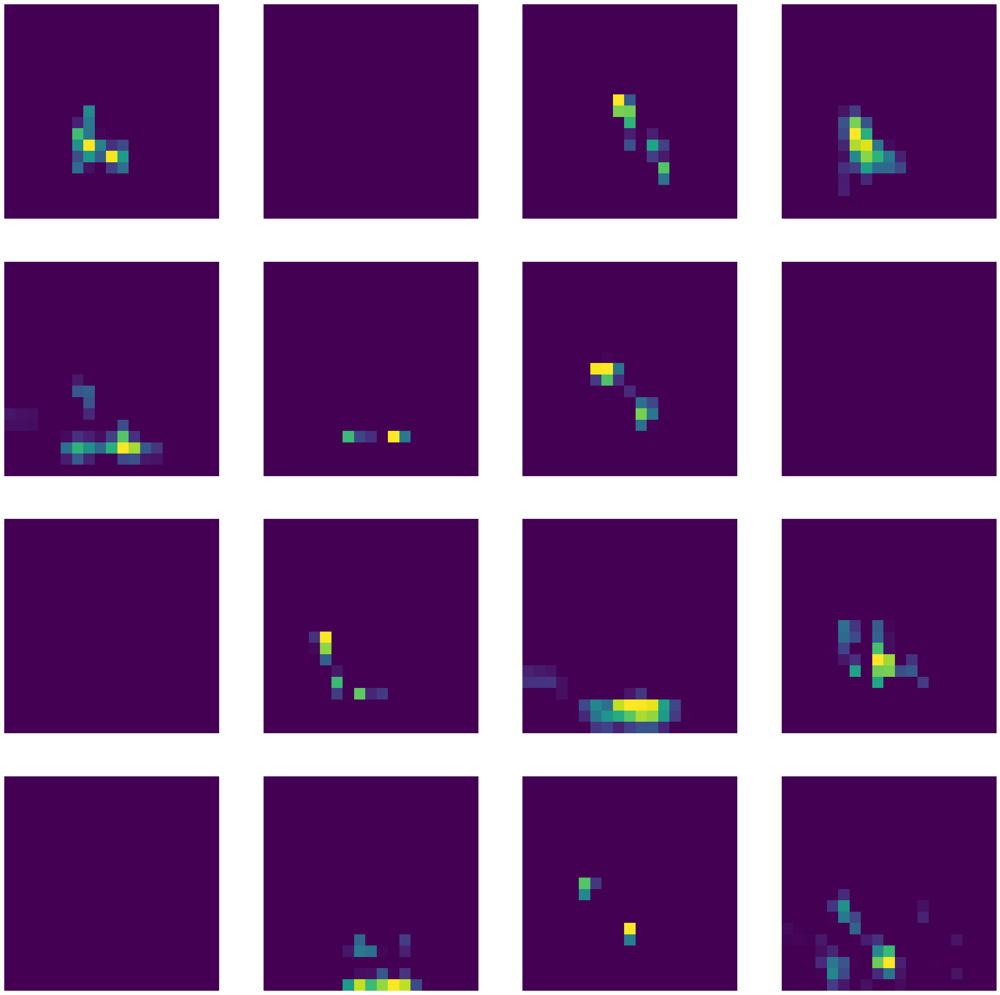

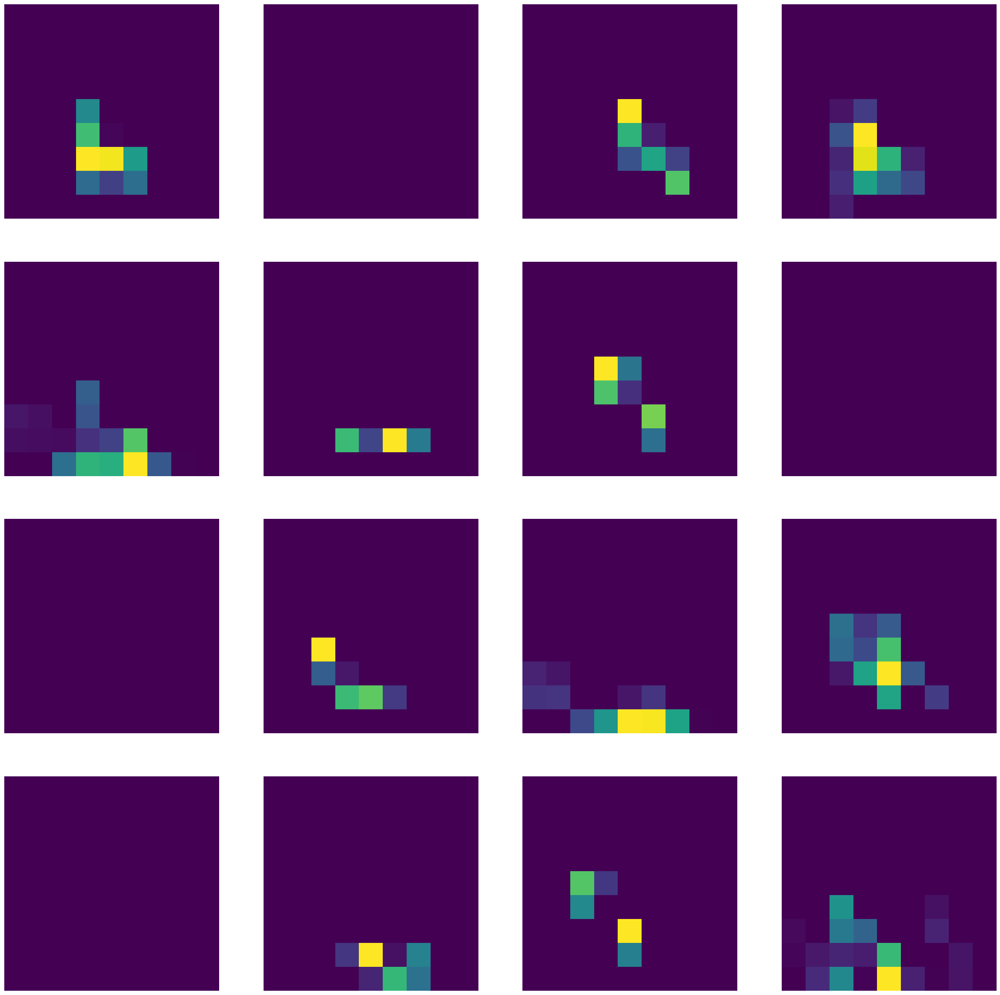

In [23]:
def display_image_filtered(name_image,model,layer_name,image):
    inp= model.inputs
    out1= model.get_layer(layer_name).output
    feature_map_1= Model(inputs= inp, outputs= out1)
    img=cv2.resize(image,(200,200))
    input_img= np.expand_dims(img, axis=0)
    f=feature_map_1.predict(input_img)
    dim = f.shape[3]
    print(f'{layer_name} | Features Shape: {f.shape}')
    print(f'Dimension {dim}')

    # Calculate grid dimensions based on 'dim' to ensure enough subplots
    grid_size = int(np.ceil(np.sqrt(dim))) # Ensures a square grid large enough

    fig= plt.figure(figsize=(30,30))
    if not os.path.exists(f'results_{name_image}'):
        os.makedirs(f'results_{name_image}')
    for i in range(dim):
        # Use calculated grid dimensions
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.axis('off')
        ax.imshow(f[0,:,:,i])
        plt.imsave(f'results_{name_image}/{name_image}_{layer_name}_{i}.jpg',f[0,:,:,i])


num = 0
for name in ['Car','Bike']:
    if name == 'Bike':
        image_path = "/content/datasets/Test/Bike/Bike (1055).jpeg" # Assign path to image_path
    elif name == 'Car':
        image_path = "/content/datasets/Test/Car/Car (112).jpeg" # Assign path to image_path

    # Read the image using cv2.imread
    image = cv2.imread(image_path)

    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # Now 'image' is a NumPy array
    plt.show()
    for i in range(0,4):
        if num == 0 and i==0:
            print('-----------------------------------------------------')
            print(f'{i+1}st convolutionnal layer')
            display_image_filtered(name,model,f'conv2d',image)
            print('--------')
            print(f'{i+1}nd Pooling')
            display_image_filtered(name,model,f'max_pooling2d',image)
            print('-----------------------------------------------------')
        else:
            print('-----------------------------------------------------')
            print(f'{i+1}st convolutionnal layer')
            display_image_filtered(name,model,f'conv2d_{num+i}',image)
            print('--------')
            print(f'{i+1}nd Pooling')
            display_image_filtered(name,model,f'max_pooling2d_{num+i}',image)
            print('-----------------------------------------------------')

conv2d | Filter Shape: (4, 4, 3, 128) Bias Shape: (128,)
Dimension 128
(4, 4, 3, 128)


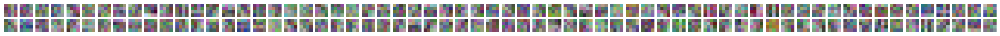

In [26]:
def display_filter(model, layer_name):
    layer = model.get_layer(layer_name)
    filter, bias= layer.get_weights()
    dim = filter.shape[3]
    print(f'{layer_name} | Filter Shape: {filter.shape} Bias Shape: {bias.shape}')
    print(f'Dimension {dim}')
    f_min, f_max = filter.min(), filter.max()
    filter = (filter - f_min) / (f_max - f_min)
    print(filter.shape)
    fig= plt.figure(figsize=(30,30))
    for i in range(dim):
        ax = fig.add_subplot(int(dim/2),int(dim/2),i+1)
        ax.axis('off')
        try:
            ax.imshow(filter[:,:,:,i])
        except:
            ax.imshow(filter[:,:,:,i][0])

# Change the layer name here to match the actual layer name in the model
display_filter(model,'conv2d') # Changed from f'conv2d_{num}' to 'conv2d'